#### [数据集说明 dataset description]

##### 数据来源 Data Sources

[数据来源](http://archive.ics.uci.edu/ml/datasets/Human+Activity+Recognition+Using+Smartphones)

##### 数据结构 data structure

见struct.jpg

#### 一、环境配置 Environment configuration

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
# 修改imputer为SimpleImputer
# from sklearn.preprocessi|ng import Imputer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import label_binarize
from sklearn import metrics

import seaborn as sns
import cv2
# from sklearn.metrics import roc_curve, auc, roc_auc_score

#### 二、数据信息配置 Data information configuration

In [2]:
# 定义根路径
# root =  '/Users/authorcai/Documents/Authorcai/CSH/HumanActivityRecognize-master/Data/UCI_HAR_Dataset/'
root = 'C:/Users/Authorcai/CSH/HumanActivityRecognization/UCI_HAR_Dataset/UCI_HAR_Dataset/'

In [3]:
# 读取数据
features = pd.read_csv(root + 'features.txt', sep='\s+', index_col=0, header=None)
train_data = pd.read_csv(root + 'train/X_train.txt', sep='\s+', names=features.values.ravel().tolist(),header=None)
test_data = pd.read_csv(root + 'test/X_test.txt', sep='\s+', names=features.values.ravel().tolist(),header=None)
train_label = pd.read_csv(root + 'train/y_train.txt', sep='\s+', header=None)
test_label = pd.read_csv(root + 'test/y_test.txt', sep='\s+', header=None)
label_name = pd.read_csv(root + 'activity_labels.txt', sep='\s+', header=None)

# drop掉label_name自带的索引列
label_name = label_name.drop(columns=0,axis=1)

In [4]:
train_data['fBodyBodyGyroJerkMag-skewness()']

0      -0.298676
1      -0.595051
2      -0.390748
3      -0.117290
4      -0.351471
          ...   
7347   -0.588433
7348   -0.390738
7349    0.025145
7350    0.063907
7351   -0.387052
Name: fBodyBodyGyroJerkMag-skewness(), Length: 7352, dtype: float64

In [5]:
# 标签信息查看
label_name

,1
0,WALKING
1,WALKING_UPSTAIRS
2,WALKING_DOWNSTAIRS
3,SITTING
4,STANDING
5,LAYING


In [6]:
# 处理label数据
def get_label_name(num):
    return label_name.iloc[num-1,0]#在原来的标签号基础上减一


In [7]:
train_data['label']=train_label
test_data['label']=test_label

In [8]:
# 匹配索引号和对应姿势名称
train_data['label_name']=train_data['label'].map(get_label_name)
test_data['label_name']=test_data['label'].map(get_label_name)

# 查看train_data是否匹配成功
pd.DataFrame(train_data['label_name'])['label_name'].value_counts()
# 查看test_data是否匹配成功
#pd.DataFrame(test_data['label_name'])['label_name'].value_counts()

LAYING                1407
STANDING              1374
SITTING               1286
WALKING               1226
WALKING_UPSTAIRS      1073
WALKING_DOWNSTAIRS     986
Name: label_name, dtype: int64

In [9]:
pd.DataFrame(test_data['label_name'])['label_name'].value_counts()

LAYING                537
STANDING              532
WALKING               496
SITTING               491
WALKING_UPSTAIRS      471
WALKING_DOWNSTAIRS    420
Name: label_name, dtype: int64

<AxesSubplot:title={'center':'activity type'}>

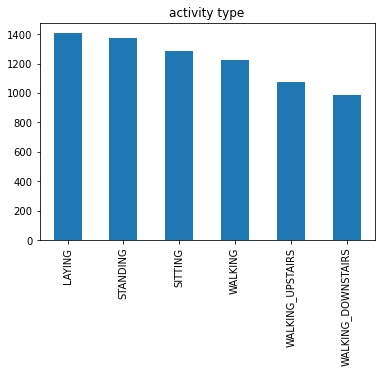

In [10]:
# 训练数据分类数量
train_data['label_name'].value_counts().plot(kind='bar', title='activity type')

<AxesSubplot:title={'center':'activity type'}>

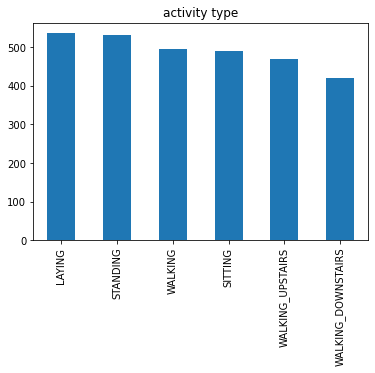

In [11]:
# 训练数据分类数量
test_data['label_name'].value_counts().plot(kind='bar', title='activity type')

##### （添加）定义函数删除无用特征

In [12]:
# # 读取无用特征
# features_useless = pd.read_csv('Data/features_useless.txt',sep=' ',names=['index','features'])
# # 作为将要删除的特征列
# features_del = features_useless['features'].to_list()

In [14]:
# features_del[:10]

In [15]:
# train_data = train_data.drop(features_del,axis=1)

In [16]:
# test_data = test_data.drop(features_del,axis=1)

##### （一）处理空值 Handling null values

In [17]:
# 将初始数据的空值用NaN替代
train_data.replace("?",np.NaN).head()
test_data.replace("?",np.NaN).head()

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",label,label_name
0,0.257178,-0.023285,-0.014654,-0.938404,-0.920091,-0.667683,-0.952501,-0.925249,-0.674302,-0.894088,...,-0.705974,0.006462,0.162920,-0.825886,0.271151,-0.720009,0.276801,-0.057978,5,STANDING
1,0.286027,-0.013163,-0.119083,-0.975415,-0.967458,-0.944958,-0.986799,-0.968401,-0.945823,-0.894088,...,-0.594944,-0.083495,0.017500,-0.434375,0.920593,-0.698091,0.281343,-0.083898,5,STANDING
2,0.275485,-0.026050,-0.118152,-0.993819,-0.969926,-0.962748,-0.994403,-0.970735,-0.963483,-0.939260,...,-0.640736,-0.034956,0.202302,0.064103,0.145068,-0.702771,0.280083,-0.079346,5,STANDING
3,0.270298,-0.032614,-0.117520,-0.994743,-0.973268,-0.967091,-0.995274,-0.974471,-0.968897,-0.938610,...,-0.736124,-0.017067,0.154438,0.340134,0.296407,-0.698954,0.284114,-0.077108,5,STANDING
4,0.274833,-0.027848,-0.129527,-0.993852,-0.967445,-0.978295,-0.994111,-0.965953,-0.977346,-0.938610,...,-0.846595,-0.002223,-0.040046,0.736715,-0.118545,-0.692245,0.290722,-0.073857,5,STANDING


In [18]:
train_data.shape

(7352, 563)

In [19]:
test_data.shape

(2947, 563)

##### （二）处理缺省值 Handling default values

In [20]:
# 无缺省，无需处理缺省值

##### （三）训练集和测试集信息说明 Training set and test set information description

In [21]:
print("训练集样本模型:%d，特征属性：%d, 目标属性:%d " %(train_data.shape[0],train_data.shape[1],train_label.shape[1]))

训练集样本模型:7352，特征属性：563, 目标属性:1 


In [22]:
print("训练集样本模型:%d，特征属性：%d, 目标属性:%d " %(test_data.shape[0],test_data.shape[1],train_label.shape[1]))

训练集样本模型:2947，特征属性：563, 目标属性:1 


##### （四）根据算法要求处理数据  Process data according to algorithm requirements

In [23]:
#制作训练集和测试集，使格式符合sklean算法要求
x_train=train_data.iloc[:,:-2].values # 训练集X特征数据
x_test=train_data.iloc[:,-2].values # 训练集X标签数据
y_train=test_data.iloc[:,:-2].values # 测试集Y合特征数据
y_test=test_data.iloc[:,-2].values # 测试集Y标签数据


In [24]:
pd.DataFrame(y_test)[0].value_counts()

6    537
5    532
1    496
4    491
2    471
3    420
Name: 0, dtype: int64

In [25]:
# 查看处理后的数据信息
print(x_train.shape)
print(x_test.shape)

(7352, 561)
(7352,)


#### 三、对数据进行降维分析 Perform dimensionality reduction analysis on data

##### （一）TSNE降维分析 Dimensionality reduction analysis

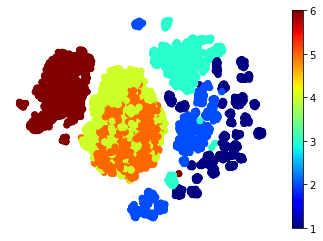

In [26]:
# 数据降维分析TSNE
#对数据进行降维可视化
#使用t-sne进行可视化分析
from sklearn.manifold import TSNE

tsne=TSNE(n_components=2)#调入t-sne(将数据降成二维)
out=tsne.fit_transform(x_train)#使用t-sne，处理数据
plt.scatter(out[:, 0], out[:, 1], c=x_test,cmap='jet')#画图
plt.axis('off')
plt.colorbar()
plt.show()
# plt.savefig('论文图表资料/TSNE降维结果.tif',format='tif')

##### （二）PCA降维分析 Dimensionality reduction analysis

In [27]:
# PCA降维
from sklearn.decomposition import PCA
pca = PCA(.99)#建立pca模型
X2D = pca.fit_transform(x_train)#使用pca，处理数据，训练并降维
radtio=pca.explained_variance_ratio_#画图，每个主成成分占方差比例
print(pca.n_components)#n_components指示主成成分有有的元素数量

0.99


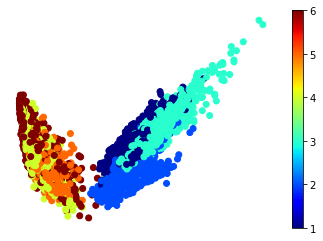

In [28]:
# PCA降维结果可视化
plt.scatter(X2D[:, 0], X2D[:, 1], c=x_test,cmap='jet')
plt.axis('off')
plt.colorbar()
plt.show()
#plt.savefig('论文图表资料/PCA降维结果.tif',format='tif')

##### （三）降维结果总结 Summary of dimensionality reduction results

In [29]:
#pca降维，失去了结构信息;
#t-sne使属于流形学习，能将高维流形映射到低维空间，保留了结构;
#通过t-snef降维分析结果可知，使用该方法效果更加直观;
#从分析结果大致可以看出姿势3和姿势4,姿势5不好区分

#### 四、根据特征对数据进行分布分析 Distribute analysis of data based on characteristics

##### （零）生成单个特征对应的6类姿态的统计直方图

In [30]:
# 定义绘图函数
def GetPics(feature):
    plt.figure(figsize=(15,8))
    # 分别对应'WALKING', 'WALKING_UPSTAIRS','WALKING_DOWNSTAIRS','SITTING','STANDING','LAYING'6类姿态
    hist_w = train_data[train_data['label_name']=='WALKING'][feature]
    hist_wu = train_data[train_data['label_name']=='WALKING_UPSTAIRS'][feature]
    hist_wd = train_data[train_data['label_name']=='WALKING_DOWNSTAIRS'][feature]
    hist_s = train_data[train_data['label_name']=='SITTING'][feature]
    hist_st = train_data[train_data['label_name']=='STANDING'][feature]
    hist_l = train_data[train_data['label_name']=='LAYING'][feature]
    
    histset = [hist_w,hist_wu,hist_wd,hist_s,hist_st,hist_l]
    
    # 分别定义6类姿态下的概率分布直方图
#     ax_w = sns.distplot(hist_w,bins=None,kde=False,hist=True)
#     plt.savefig('/Users/authorcai/Documents/Authorcai/CSH/HumanActivityRecognize-master/论文图表资料/3.3 测试用图/'+
#                 feature+'_ax_w.jpg',format='jpg')
#     ax_wu = sns.distplot(hist_wu,bins=None,kde=False,hist=True)
#     plt.savefig('/Users/authorcai/Documents/Authorcai/CSH/HumanActivityRecognize-master/论文图表资料/3.3 测试用图/'+
#                 feature+'_ax_wu.jpg',format='jpg')
#     ax_wd = sns.distplot(hist_wd,bins=None,kde=False,hist=True)

#     plt.savefig('/Users/authorcai/Documents/Authorcai/CSH/HumanActivityRecognize-master/论文图表资料/3.3 测试用图/'+
#                 feature+'_ax_wd.jpg',format='jpg')

#     ax_s = sns.distplot(hist_s,bins=None,kde=False,hist=True)
#     plt.savefig('/Users/authorcai/Documents/Authorcai/CSH/HumanActivityRecognize-master/论文图表资料/3.3 测试用图/'+
#                 feature+'_ax_s.jpg',format='jpg')
    ax_st = sns.distplot(hist_st,bins=None,kde=False,hist=True)

#     ax_l = sns.distplot(hist_l,bins=None,kde=False,hist=True)
#     plt.savefig('/Users/authorcai/Documents/Authorcai/CSH/HumanActivityRecognize-master/论文图表资料/3.3 测试用图/'+
#                 feature+'_ax_l.jpg',format='jpg')
    # 通过列表存储
    axset = ['w','wu','wd','s','st','l']
    
    for i in range(0,6):
        plt.close()
        sns.distplot(histset[i],bins=None,kde=False,hist=True)
        plt.rcParams['savefig.dpi'] = 400 # 图片像素
        plt.rcParams['figure.dpi'] = 400 # 分辨率
        plt.xticks([])
        plt.yticks([])
        plt.ylim(0,250)
        plt.xlim(-1.5,1.5)
        plt.savefig('/Users/authorcai/Documents/Authorcai/CSH/HumanActivityRecognize-master/徐老师测试/'+
            feature+'_ax_'+axset[i]+'.jpg',format='jpg')
        plt.close()

In [31]:
# # 完成对论文中6个特征直方图的绘制
# f_similar = ['fBodyBodyGyroJerkMag-kurtosis()','fBodyBodyGyroJerkMag-skewness()']
# f_unsimilar = ['angle(X,gravityMean)','fBodyAccMag-entropy()']
# for i,feature in enumerate(f_similar):
#     print(feature)
#     GetPics(feature)

##### （一）定义特征分布分析函数 Define the feature distribution analysis function

In [32]:
#对某一个特征观察分布，输入为特征列名称，输出为分布结果
def plot_feature(feature_name):#想分析哪个特征，就将特征名输入函数即可
    plt.figure(figsize=(15,8))
    plt.title("Sensor data distribution for all label")
    class_indexs=list(label_name.values.ravel())#得到所有类别
    
    for class_index in class_indexs:#根据类别，画出
        data = train_data[train_data['label_name']==class_index][feature_name]
        sns.distplot(data, label=class_index)
    
    plt.legend()#给图像加上图例
    # 设置像素和分辨率
    plt.rcParams['savefig.dpi'] = 1600 # 图片像素
    plt.rcParams['figure.dpi'] = 1600 # 分辨率
    plt.ylim(0,10)
    plt.show()
    return data
#     plt.savefig('/Users/authorcai/Documents/Authorcai/CSH/HumanActivityRecognize-master/论文图表资料/3.3 所有特征向量分析图_高分辨率/'+feature_name+'.tif',format='tif')# plots the distribution of all the columns of both left and wright wrist

##### （二）依次分析特征 Analyze features in turn

###### （1）特征 feature一：tBodyAcc-mean()-X

   0:angle(X,gravityMean)


C:\Users\Authorcai\.conda\envs\Cloth\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Authorcai\.conda\envs\Cloth\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Authorcai\.conda\envs\Cloth\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar fle

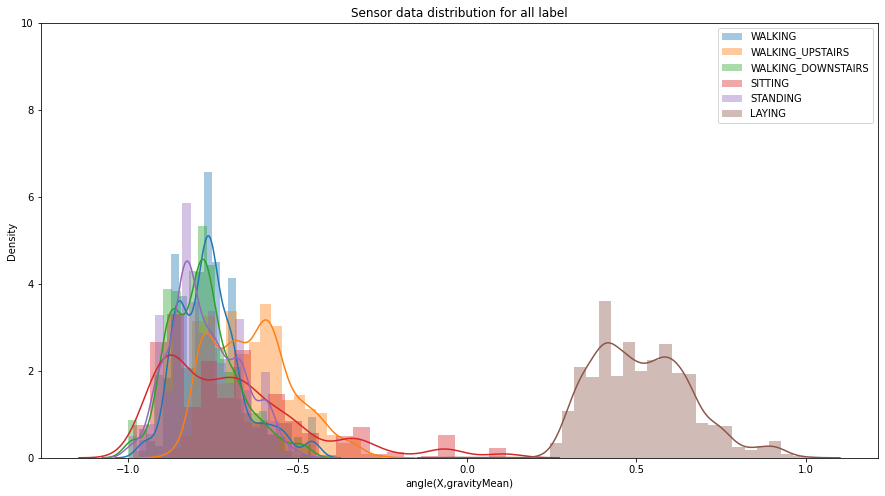

In [33]:
for i,v in enumerate(['angle(X,gravityMean)']):
    print("%4d:%s" %(i,v))
    data = plot_feature(v)

In [34]:
for i,v in enumerate(list(features.values)[:3]):
    print("%4d:%s" %(i,v[0]))
    plot_feature(v[0])

   0:tBodyAcc-mean()-X


C:\Users\Authorcai\.conda\envs\Cloth\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Authorcai\.conda\envs\Cloth\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Authorcai\.conda\envs\Cloth\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar fle

   1:tBodyAcc-mean()-Y


C:\Users\Authorcai\.conda\envs\Cloth\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Authorcai\.conda\envs\Cloth\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Authorcai\.conda\envs\Cloth\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar fle

   2:tBodyAcc-mean()-Z


C:\Users\Authorcai\.conda\envs\Cloth\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Authorcai\.conda\envs\Cloth\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\Authorcai\.conda\envs\Cloth\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar fle

#### 三、建立随机森林模型训练 Build random forest model training

##### （一）构建模型 Build model

In [35]:
from sklearn.ensemble import RandomForestClassifier
# 使用GridSeachCV自动调参，解决手动调参存在的种种问题
from sklearn.model_selection import GridSearchCV 
#对max_features和n_estimators进行选择
clf = RandomForestClassifier(max_features=None,random_state=0)
estimator=np.arange(20,200,5)
my_max_features = [ 'sqrt','log2','int','float']
max_depth = [2,3,5,10]
min_impurity_decrease = [0.1,0.2,0.5]
#sqrt
param_grid={'n_estimators':estimator,"max_features":[my_max_features[0]]}
gs_s=GridSearchCV(estimator=clf,param_grid=param_grid,cv=10,verbose=4,n_jobs=-1)
#log2
param_grid={'n_estimators':estimator,"max_features":[my_max_features[1]]}
gs_l=GridSearchCV(estimator=clf,param_grid=param_grid,cv=10,verbose=4,n_jobs=-1)
#int 
param_grid={'n_estimators':estimator,"max_features":['auto']}
gs_a=GridSearchCV(estimator=clf,param_grid=param_grid,cv=10,verbose=4,n_jobs=-1)
#float
# param_grid={'n_estimators':estimator,"max_features":[my_max_features[0]]}
# gs_f=GridSearchCV(estimator=clf,param_grid=param_grid,cv=10,verbose=4,n_jobs=-1)

In [37]:
gs_s.fit(x_train,x_test)

Fitting 10 folds for each of 36 candidates, totalling 360 fits


GridSearchCV(cv=10,
             estimator=RandomForestClassifier(max_features=None,
                                              random_state=0),
             n_jobs=-1,
             param_grid={'max_features': ['sqrt'],
                         'n_estimators': array([ 20,  25,  30,  35,  40,  45,  50,  55,  60,  65,  70,  75,  80,
        85,  90,  95, 100, 105, 110, 115, 120, 125, 130, 135, 140, 145,
       150, 155, 160, 165, 170, 175, 180, 185, 190, 195])},
             verbose=4)

In [38]:
gs_l.fit(x_train,x_test)

Fitting 10 folds for each of 36 candidates, totalling 360 fits


GridSearchCV(cv=10,
             estimator=RandomForestClassifier(max_features=None,
                                              random_state=0),
             n_jobs=-1,
             param_grid={'max_features': ['log2'],
                         'n_estimators': array([ 20,  25,  30,  35,  40,  45,  50,  55,  60,  65,  70,  75,  80,
        85,  90,  95, 100, 105, 110, 115, 120, 125, 130, 135, 140, 145,
       150, 155, 160, 165, 170, 175, 180, 185, 190, 195])},
             verbose=4)

In [39]:
gs_a.fit(x_train,x_test)

Fitting 10 folds for each of 36 candidates, totalling 360 fits


GridSearchCV(cv=10,
             estimator=RandomForestClassifier(max_features=None,
                                              random_state=0),
             n_jobs=-1,
             param_grid={'max_features': ['auto'],
                         'n_estimators': array([ 20,  25,  30,  35,  40,  45,  50,  55,  60,  65,  70,  75,  80,
        85,  90,  95, 100, 105, 110, 115, 120, 125, 130, 135, 140, 145,
       150, 155, 160, 165, 170, 175, 180, 185, 190, 195])},
             verbose=4)

In [44]:
def plot_train_process(gs,name):
    # gs.fit(x_train,x_test)
    means = gs.cv_results_['mean_test_score']
    params = gs.cv_results_['params']

    x = np.arange(20,200,5)
    y = gs.cv_results_['mean_test_score']

    plt.plot(x,y*100)
    plt.legend()
    plt.title('Gridsearchcv Training Process Chart')
    plt.xlabel('Number of Decision Trees')
    plt.ylabel('Recognition Accuracy%')
    plt.rc('font', family='SimHei', size=13)
#     plt.savefig('/Users/authorcai/Documents/Authorcai/CSH/HumanActivityRecognize-master/论文图表资料/'+name+'.tif',format='tif')
    plt.show()
plot_train_process(gs_l,'gs_l')
# plot_train_process(gs_a,'gs_a')
plot_train_process(gs_s,'gs_s')
# plot_train_process(gs_f,'gs_f')

No handles with labels found to put in legend.


No handles with labels found to put in legend.


##### （二）训练模型 Training model

In [45]:
print('最优分类器:',gs_a.best_params_,'最优分数:', gs_a.best_score_)  # 得到最优的参数和分值
gs = gs_a

最优分类器: {'max_features': 'auto', 'n_estimators': 125} 最优分数: 0.9324057231588286


In [46]:
# from sklearn.datasets import load_iris
# iris = load_iris()

# # 模型(也可用单个决策树)
# from sklearn.ensemble import RandomForestClassifier
# model = RandomForestClassifier(n_estimators=10)

# # 训练
# model.fit(iris.data, iris.target)
# # 提取一个决策树
# estimator = model.estimators_[5]

# from sklearn.tree import export_graphviz
# # 导出为dot 文件
# export_graphviz(estimator, out_file='tree.dot', 
#                 feature_names = iris.feature_names,
#                 class_names = iris.target_names,
#                 rounded = True, proportion = False, 
#                 precision = 2, filled = True)

# # 用系统命令转为PNG文件(需要 Graphviz)
# from subprocess import call
# call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# # 在jupyter notebook中展示
# from IPython.display import Image
# Image(filename = 'tree.png')

##### （三）评估模型 Evaluation model

In [47]:
# 通过best_score
best_score = gs.best_score_
best_param = gs.best_params_
best_estimator = gs.best_estimator_
print("(1)模型的准确率为：%.2f%%\n" %(best_score*100))

# 通过表格形式展示参数数据
print("(2)模型的最佳参数信息：")
dict = pd.DataFrame(pd.Series(best_param),columns=['value'])
dict

(1)模型的准确率为：93.24%

(2)模型的最佳参数信息：


,value
max_features,auto
n_estimators,125


##### （四）模型预测 Model prediction

###### （1）获取预测结果 Get prediction results

In [48]:
# 通过predict获取模型预测结果
prediction = best_estimator.predict(y_train)
prediction_new = pd.DataFrame(prediction)
prediction_new.columns=['activity']

# 对预测结果数量进行统计
prediction_new['activity'].value_counts()
prediction_new

# 对预测结果标签进行数字替换，按names进行替换
names = {
    1:'WALKING',
    2:'WALKING_UPSTAIRS',
    3:'WALKING_DOWNSTAIRS',
    4:'SITTING',
    5:'STANDING',
    6:'LAYING'
}
prediction_new['activity']= prediction_new['activity'].map(names)
# prediction_new.loc[prediction_new['activity' == 1]] = names[1]
# prediction_new.loc[prediction_new['activity' == 2]] = names[2]
# prediction_new.loc[prediction_new['activity' == 3]] = names[3]
# prediction_new.loc[prediction_new['activity' == 4]] = names[4]
# prediction_new.loc[prediction_new['activity' == 5]] = names[5]
# prediction_new.loc[prediction_new['activity' == 6]] = names[6]

# 查看预测结果信息
prediction_new['activity'].describe()
prediction_new['activity'].value_counts()

STANDING              542
WALKING               539
LAYING                537
SITTING               481
WALKING_UPSTAIRS      479
WALKING_DOWNSTAIRS    369
Name: activity, dtype: int64

###### (2)处理预测结果 Processing forecast results

In [49]:
y_true = y_test

In [50]:
pd.DataFrame(prediction)[0].value_counts()

5    542
1    539
6    537
4    481
2    479
3    369
Name: 0, dtype: int64

In [51]:
pd.DataFrame(y_true)[0].value_counts()

6    537
5    532
1    496
4    491
2    471
3    420
Name: 0, dtype: int64

In [52]:
# 对prediciton 作-1处理
i = 0
for value in prediction:
    prediction[i]=value-1
    i = i+1
    
# 对y_test 作-1处理
i = 0
for value in y_test:
    y_true[i]=value-1
    i = i+1


In [82]:
# 对y_test 作-1处理
i = 0
for value in y_test:
    y_true[i]=value-1
    i = i+1

In [83]:
pd.DataFrame(prediction)[0].value_counts()

4    542
0    539
5    537
3    481
1    479
2    369
Name: 0, dtype: int64

In [84]:
pd.DataFrame(y_true)[0].value_counts()

5    537
4    532
0    496
3    491
1    471
2    420
Name: 0, dtype: int64

In [79]:
# 对y_test 作-1处理
i = 0
for value in y_test:
    y_true[i]=value-1
    i = i+1

In [85]:
prediction

array([4, 4, 4, ..., 1, 1, 1], dtype=int64)

###### （2）预测结果可视化 Visualization of forecast results

In [86]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
# 生成获取混淆矩阵
cm = confusion_matrix(y_true=y_true,y_pred=prediction)

In [87]:
# 查看混淆矩阵
cm

array([[486,   3,   7,   0,   0,   0],
       [ 32, 432,   7,   0,   0,   0],
       [ 21,  44, 355,   0,   0,   0],
       [  0,   0,   0, 438,  53,   0],
       [  0,   0,   0,  43, 489,   0],
       [  0,   0,   0,   0,   0, 537]], dtype=int64)

In [88]:
# 混淆矩阵信息添加
columns = ['WALKING', 'WALKING_UPSTAIRS','WALKING_DOWNSTAIRS','SITTING','STANDING','LAYING']
cm_df = pd.DataFrame(cm)
cm_df.columns = columns
cm_df.index = columns

# 展示混淆矩阵
cm_df

,WALKING,WALKING_UPSTAIRS,WALKING_DOWNSTAIRS,SITTING,STANDING,LAYING
WALKING,486,3,7,0,0,0
WALKING_UPSTAIRS,32,432,7,0,0,0
WALKING_DOWNSTAIRS,21,44,355,0,0,0
SITTING,0,0,0,438,53,0
STANDING,0,0,0,43,489,0
LAYING,0,0,0,0,0,537


In [89]:
import seaborn as sns
#转换成dataframe，转不转一样
#fmt参数不使用科学计数法进行显示
ax = sns.heatmap(cm_df,annot=True,fmt='.20g',center=120,vmin=0,vmax=600)
ax.set_title('confusion matrix') #标题
ax.set_xlabel('predict') #x轴
ax.set_ylabel('true') #y轴

Text(717.5555555555552, 0.5, 'true')

In [56]:
x1 = 488/(488+22+21)
x2 = 442/(1+442+54)
x3 = 345/(7+7+345)
x4 = 425/(425+11)
x5 = 521/(66+514)

y1 = 488/(488+1+7)
y2 = 442/(22+440+7)
y3 = 345/(21+54+345)
y4 = 425/(441+66)
y5 = 521/(11+521)
print((x1+x2+x3+x4+x5)/5)
print((y1+y2+y3+y4+y5)/5)

0.928481204302717
0.9130635701737357


Text(29.999999999999993, 0.5, 'true')

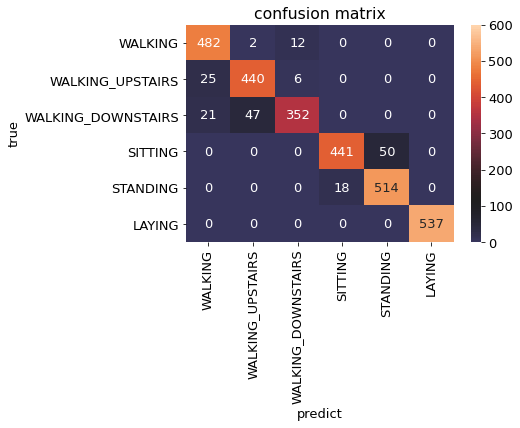

In [57]:
import seaborn as sns
#转换成dataframe，转不转一样
#fmt参数不使用科学计数法进行显示
ax = sns.heatmap(cm_df,annot=True,fmt='.20g',center=120,vmin=0,vmax=600)
ax.set_title('confusion matrix') #标题
ax.set_xlabel('predict') #x轴
ax.set_ylabel('true') #y轴

#### 五、结果分析 Result analysis

##### （一）重要程度分析 Importance analysis

##### （二）模型评价 Model evaluation

* 使用随机森林模型可以有效地分辨静态姿势和动态姿势
* 在使用随机森林模型处理时，对静态姿势的分类存在缺陷（不足）
* 随机森林模型在辨别sitting 和 standing分类时，存在较大缺陷

#### 四、可结合其他机器学习方法 Can be combined with other machine learning methods

##### （一）使用线性模型处理 Use linear model processing

##### （二）尝试其他类型的分类器：SVM、梯度提升树等 Try other types of classifiers: SVM, gradient boosting tree, etc.